#### 1. Importing libraries

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import  train_test_split
from prophet import Prophet
from prophet.plot import plot_plotly,plot_components_plotly
from sklearn.metrics import mean_absolute_error, mean_squared_error

import requests
import pyodbc

#### 2. Getting data from sql server

In [4]:
conn=pyodbc.connect("DSN=Weather_DB;UID=sa;PWD=123456")

In [5]:
df=pd.read_sql('SELECT * FROM Monthly_TBL',conn)

C:\Users\Neeharika\AppData\Local\Temp\ipykernel_16096\3335357811.py:1: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df=pd.read_sql('SELECT * FROM Monthly_TBL',conn)


In [6]:
df.tail()

,id,date,tavg,tmin,tmax,prcp,wspd,pres,tsun
895,896,2024-08-01,29.9,25.7,34.2,390.0,None,1001.0,8040.0
896,897,2024-09-01,29.3,24.7,33.8,193.0,None,1003.3,7140.0
897,898,2024-10-01,28.2,21.4,35.1,0.0,None,1009.1,12780.0
898,899,2024-11-01,22.2,14.7,29.7,0.0,None,1014.3,2520.0
899,900,2024-12-01,15.8,8.4,23.2,54.0,None,1016.8,2520.0


#### 3.1 Data structure and properties

In [8]:
df.shape

(900, 9)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 900 entries, 0 to 899
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   id      900 non-null    int64         
 1   date    900 non-null    datetime64[ns]
 2   tavg    803 non-null    float64       
 3   tmin    424 non-null    float64       
 4   tmax    459 non-null    float64       
 5   prcp    891 non-null    float64       
 6   wspd    0 non-null      object        
 7   pres    773 non-null    float64       
 8   tsun    534 non-null    float64       
dtypes: datetime64[ns](1), float64(6), int64(1), object(1)
memory usage: 63.4+ KB


In [10]:
df.isna().sum()

id        0
date      0
tavg     97
tmin    476
tmax    441
prcp      9
wspd    900
pres    127
tsun    366
dtype: int64

##### All values for windspeed is null

In [12]:
df.duplicated().sum()

0

In [13]:
df.describe()

,id,date,tavg,tmin,tmax,prcp,pres,tsun
count,900.000000,900,803.000000,424.000000,459.000000,891.000000,773.000000,534.000000
mean,450.500000,1987-06-16 19:56:48,25.159527,18.605425,31.307190,66.419865,1007.308797,11522.584270
min,1.000000,1950-01-01 00:00:00,12.100000,5.300000,17.200000,0.000000,994.600000,2460.000000
25%,225.750000,1968-09-23 12:00:00,19.150000,11.475000,26.150000,2.000000,1000.100000,9240.000000
50%,450.500000,1987-06-16 00:00:00,27.300000,19.850000,33.200000,20.000000,1007.500000,11820.000000
75%,675.250000,2006-03-08 18:00:00,30.600000,26.000000,35.800000,83.000000,1014.300000,13980.000000
max,900.000000,2024-12-01 00:00:00,36.200000,30.600000,42.300000,632.000000,1021.300000,19560.000000
std,259.951919,NaN,6.691610,7.418592,6.237863,102.479358,7.291199,3136.409448


#### 3.2 Data Analysis before processing

#### 3.2.1 Checking for NAN distribution

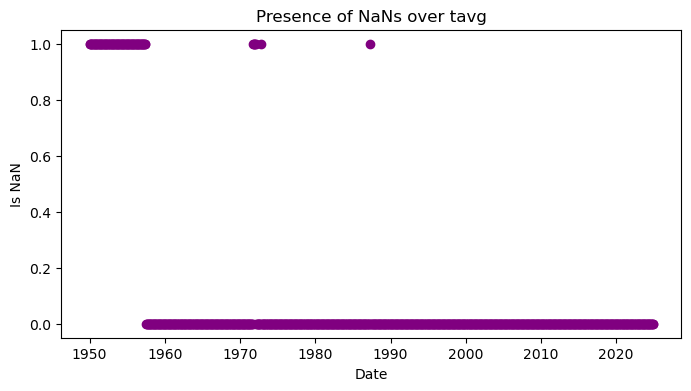

In [16]:
plt.figure(figsize=(8, 4)) 
plt.plot(df['date'], df['tavg'].isna(), linestyle='None', marker='o', color='purple')
plt.title('Presence of NaNs over tavg')
plt.xlabel('Date')
plt.ylabel('Is NaN')
plt.show()

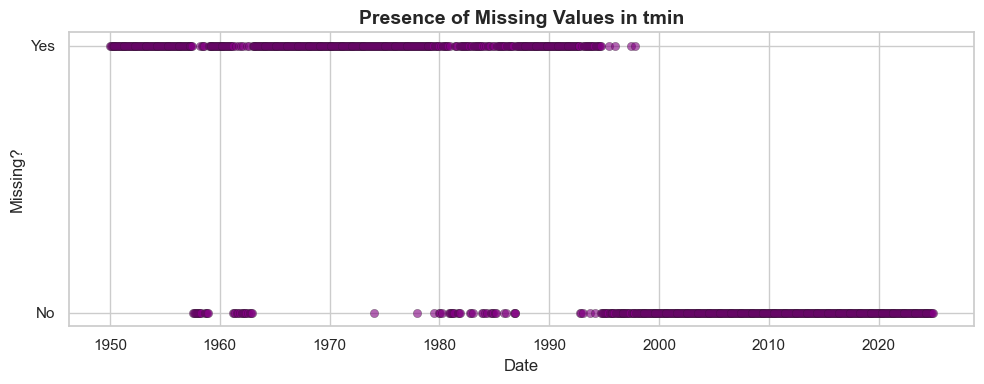

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

# Example: Apply Seaborn theme
sns.set(style="whitegrid")

plt.figure(figsize=(10, 4))
plt.scatter(
    df['date'], 
    df['tmin'].isna(), 
    marker='o', 
    color='purple', 
    alpha=0.6, 
    edgecolor='k', 
    linewidth=0.3
)

# Pretty labels
plt.yticks([0, 1], ["No", "Yes"])
plt.title('Presence of Missing Values in tmin', fontsize=14, weight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Missing?', fontsize=12)

# Improve layout
plt.tight_layout()
plt.show()


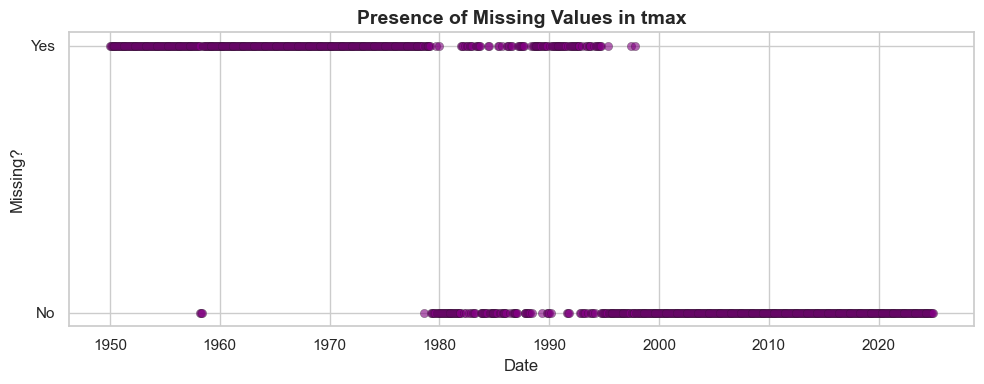

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

# Example: Apply Seaborn theme
sns.set(style="whitegrid")

plt.figure(figsize=(10, 4))
plt.scatter(
    df['date'], 
    df['tmax'].isna(), 
    marker='o', 
    color='purple', 
    alpha=0.6, 
    edgecolor='k', 
    linewidth=0.3
)

# Pretty labels
plt.yticks([0, 1], ["No", "Yes"])
plt.title('Presence of Missing Values in tmax', fontsize=14, weight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Missing?', fontsize=12)

# Improve layout
plt.tight_layout()
plt.show()


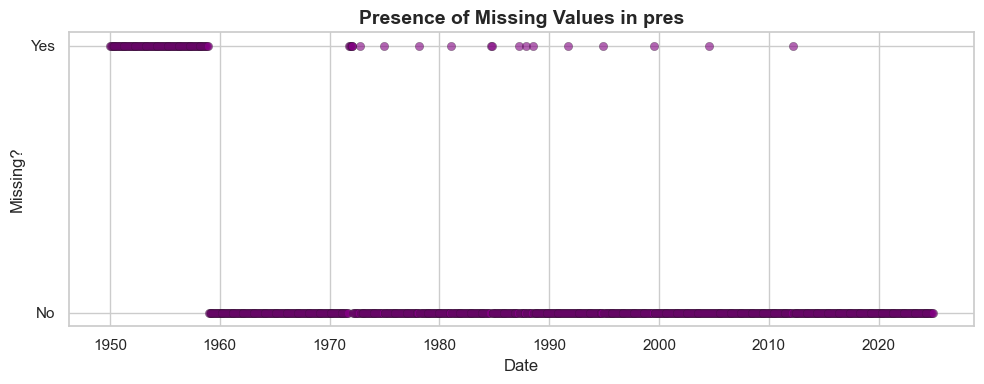

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

# Example: Apply Seaborn theme
sns.set(style="whitegrid")

plt.figure(figsize=(10, 4))
plt.scatter(
    df['date'], 
    df['pres'].isna(), 
    marker='o', 
    color='purple', 
    alpha=0.6, 
    edgecolor='k', 
    linewidth=0.3
)

# Pretty labels
plt.yticks([0, 1], ["No", "Yes"])
plt.title('Presence of Missing Values in pres', fontsize=14, weight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Missing?', fontsize=12)

# Improve layout
plt.tight_layout()
plt.show()


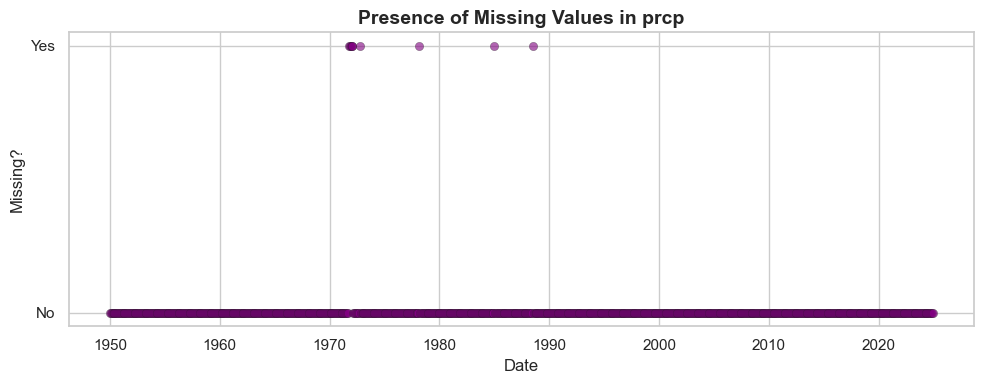

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns

# Example: Apply Seaborn theme
sns.set(style="whitegrid")

plt.figure(figsize=(10, 4))
plt.scatter(
    df['date'], 
    df['prcp'].isna(), 
    marker='o', 
    color='purple', 
    alpha=0.6, 
    edgecolor='k', 
    linewidth=0.3
)

# Pretty labels
plt.yticks([0, 1], ["No", "Yes"])
plt.title('Presence of Missing Values in prcp', fontsize=14, weight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Missing?', fontsize=12)

# Improve layout
plt.tight_layout()
plt.show()


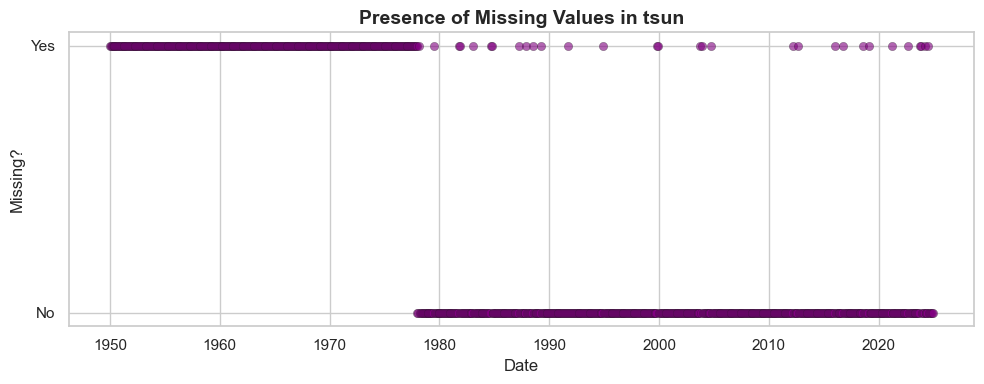

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns

# Example: Apply Seaborn theme
sns.set(style="whitegrid")

plt.figure(figsize=(10, 4))
plt.scatter(
    df['date'], 
    df['tsun'].isna(), 
    marker='o', 
    color='purple', 
    alpha=0.6, 
    edgecolor='k', 
    linewidth=0.3
)

# Pretty labels
plt.yticks([0, 1], ["No", "Yes"])
plt.title('Presence of Missing Values in tsun', fontsize=14, weight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Missing?', fontsize=12)

# Improve layout
plt.tight_layout()
plt.show()


##### Time Periods with minimum NAN (approx):
##### tavg - from 1980
##### tmin - from 1995
##### tmax - from 1980
##### pres - from 1960
##### prcp - from 1950
##### tsun - from 1980

#### The dataset will be limited to records from the 1980s onward.

In [23]:
df=df[df['date'].dt.year>=1980]

In [24]:
df.head()

,id,date,tavg,tmin,tmax,prcp,wspd,pres,tsun
360,361,1980-01-01,14.1,NaN,NaN,5.0,None,1016.6,14040.0
361,362,1980-02-01,18.1,11.0,25.3,9.0,None,1013.5,14880.0
362,363,1980-03-01,21.6,NaN,28.1,26.0,None,1011.9,12780.0
363,364,1980-04-01,30.3,23.1,38.2,1.0,None,1005.1,16740.0
364,365,1980-05-01,34.5,NaN,41.3,12.0,None,1000.2,16740.0


In [25]:
df.isna().sum()

id        0
date      0
tavg      1
tmin    148
tmax     93
prcp      2
wspd    540
pres     11
tsun     28
dtype: int64

In [26]:
df.shape

(540, 9)

#### 3.2.2 NaN Distribution

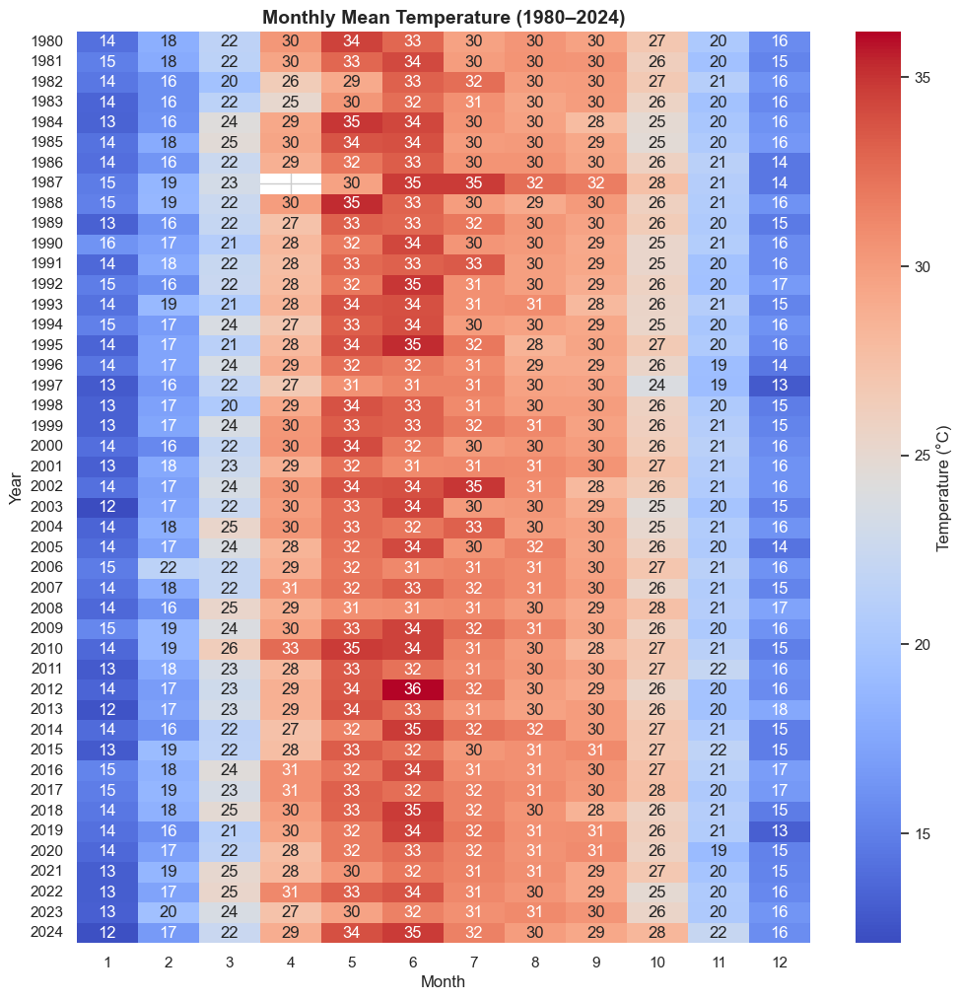

In [28]:
pivot = df.pivot_table(values="tavg", index=df['date'].dt.year, columns=df['date'].dt.month)
plt.figure(figsize=(12,12))
sns.heatmap(pivot, cmap="coolwarm", cbar_kws={'label': 'Temperature (°C)'},annot=True,fmt='.2g')
plt.title("Monthly Mean Temperature (1980–2024)", fontsize=14, weight="bold")
plt.xlabel("Month")
plt.ylabel("Year")
plt.show()


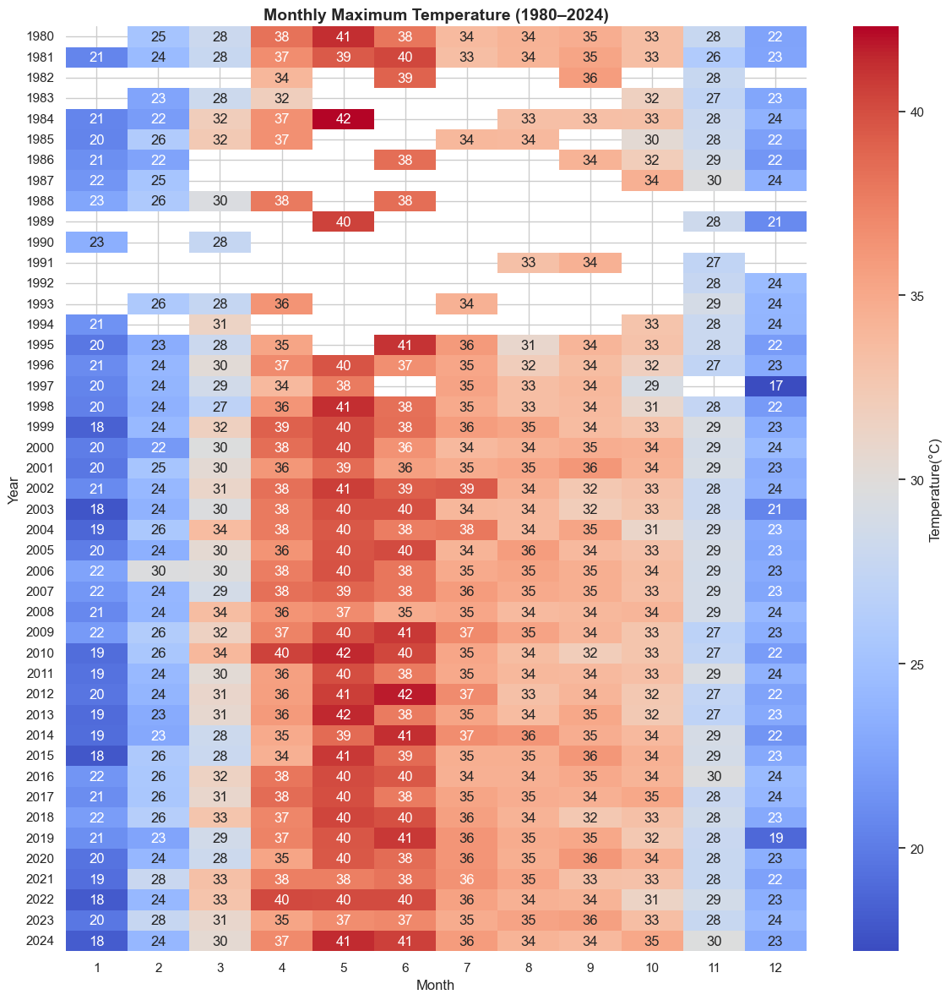

In [29]:
pivot=df.pivot_table(values='tmax',index=df['date'].dt.year,columns=df['date'].dt.month)
plt.figure(figsize=(12,12))
sns.heatmap(pivot,cmap="coolwarm",annot=True,fmt='.2g',cbar_kws={'label':'Temperature(°C)'})
plt.title("Monthly Maximum Temperature (1980–2024)", fontsize=14, weight="bold")
plt.xlabel("Month")
plt.ylabel("Year")
plt.tight_layout()
plt.show()            

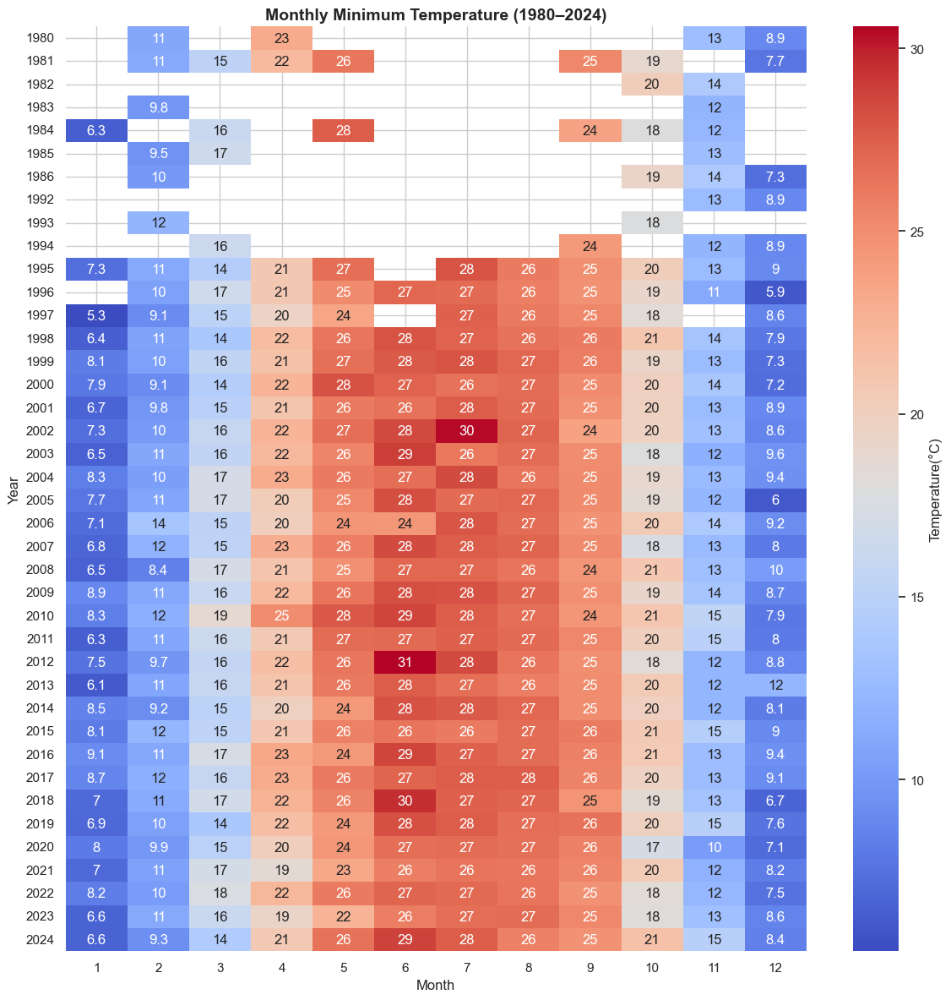

In [30]:
pivot=df.pivot_table(values='tmin',index=df['date'].dt.year,columns=df['date'].dt.month)
plt.figure(figsize=(12,12))
sns.heatmap(pivot,cmap="coolwarm",annot=True,fmt='.2g',cbar_kws={'label':'Temperature(°C)'})
plt.title("Monthly Minimum Temperature (1980–2024)", fontsize=14, weight="bold")
plt.xlabel("Month")
plt.ylabel("Year")
plt.tight_layout()
plt.show()           

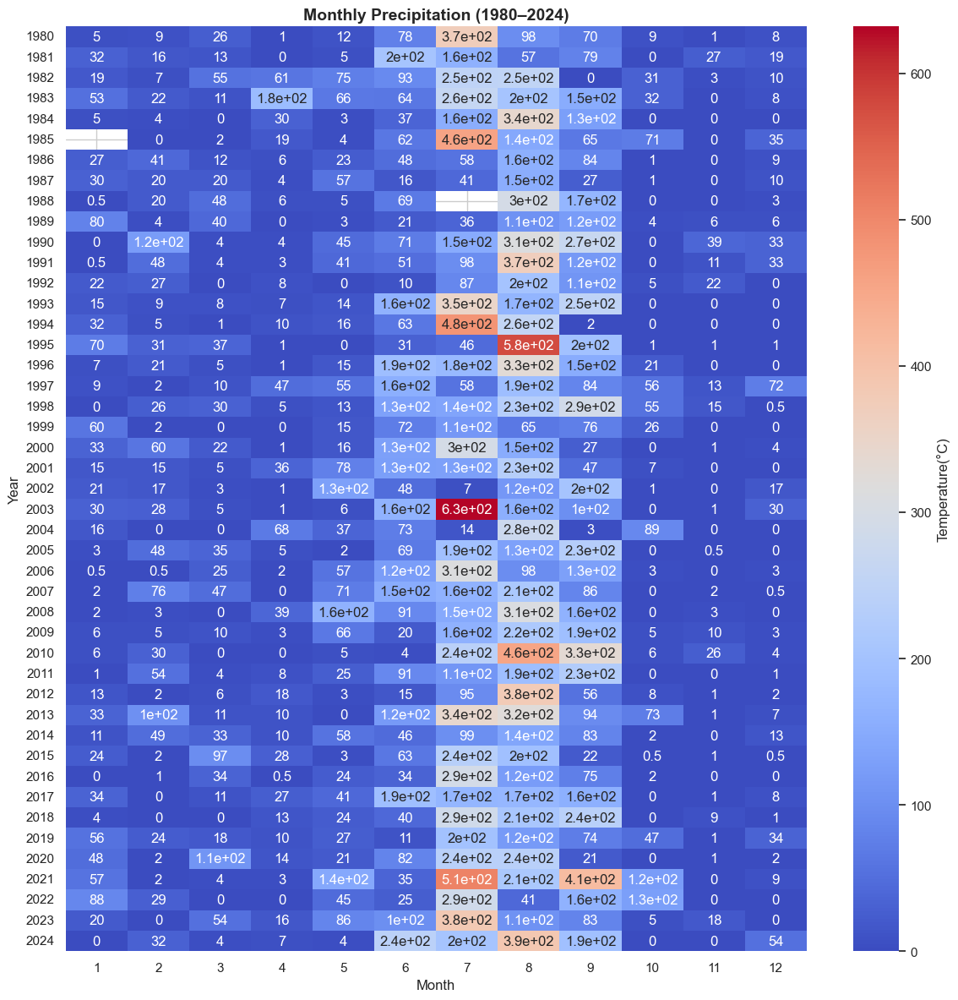

In [31]:
pivot=df.pivot_table(values='prcp',index=df['date'].dt.year,columns=df['date'].dt.month)
plt.figure(figsize=(12,12))
sns.heatmap(pivot,cmap="coolwarm",annot=True,fmt='.2g',cbar_kws={'label':'Temperature(°C)'})
plt.title("Monthly Precipitation (1980–2024)", fontsize=14, weight="bold")
plt.xlabel("Month")
plt.ylabel("Year")
plt.tight_layout()
plt.show()           

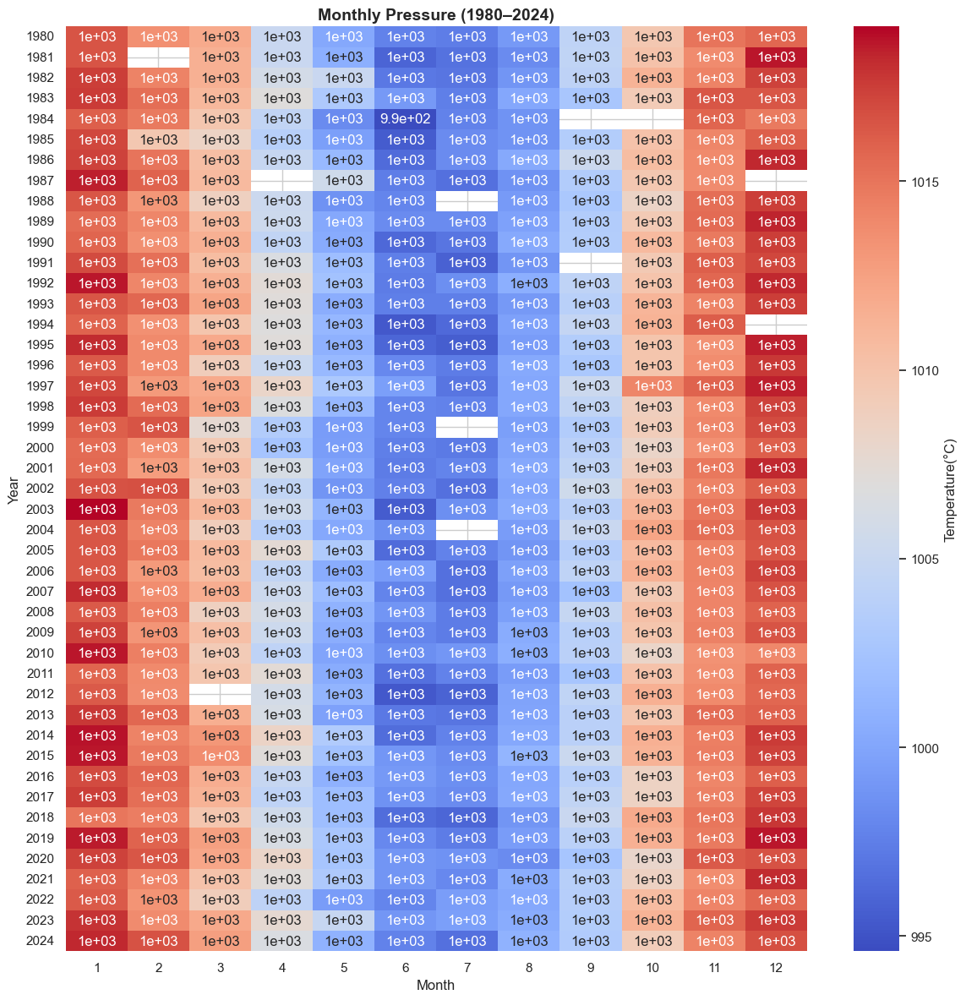

In [32]:
pivot=df.pivot_table(values='pres',index=df['date'].dt.year,columns=df['date'].dt.month)
plt.figure(figsize=(12,12))
sns.heatmap(pivot,cmap="coolwarm",annot=True,fmt='.2g',cbar_kws={'label':'Temperature(°C)'})
plt.title("Monthly Pressure (1980–2024)", fontsize=14, weight="bold")
plt.xlabel("Month")
plt.ylabel("Year")
plt.tight_layout()
plt.show()           

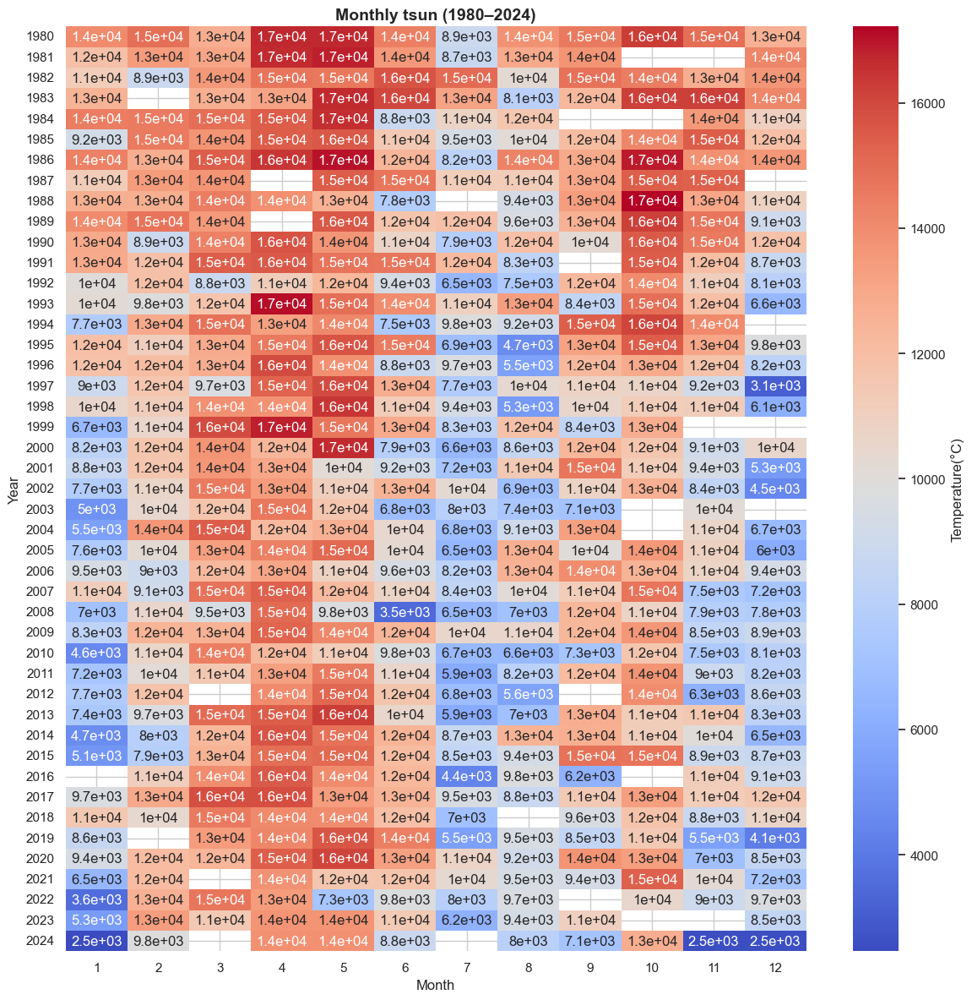

In [33]:
pivot=df.pivot_table(values='tsun',index=df['date'].dt.year,columns=df['date'].dt.month)
plt.figure(figsize=(12,12))
sns.heatmap(pivot,cmap="coolwarm",annot=True,fmt='.2g',cbar_kws={'label':'Temperature(°C)'})
plt.title("Monthly tsun (1980–2024)", fontsize=14, weight="bold")
plt.xlabel("Month")
plt.ylabel("Year")
plt.tight_layout()
plt.show()           

#### 3.3 Data Cleaning and Processing

#### 3.3.1 Data Cleaning

In [36]:
df.isna().sum()

id        0
date      0
tavg      1
tmin    148
tmax     93
prcp      2
wspd    540
pres     11
tsun     28
dtype: int64

#### Interpolation

In [38]:
df.index=df['date']

In [39]:
# remove wind speed
df=df.drop(columns=['id','wspd','date'])

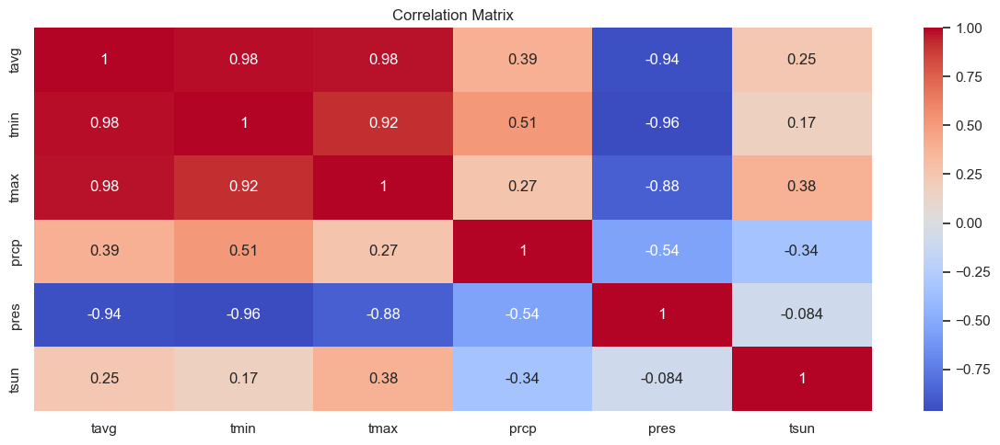

In [40]:
#corrlation before interpolation
corr=df.corr(method='pearson')
plt.figure(figsize=(12,5))
sns.heatmap(corr,annot=True,cmap='coolwarm',fmt='.2g')
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

In [41]:
df.head()

,tavg,tmin,tmax,prcp,pres,tsun
date,,,,,,
1980-01-01,14.1,NaN,NaN,5.0,1016.6,14040.0
1980-02-01,18.1,11.0,25.3,9.0,1013.5,14880.0
1980-03-01,21.6,NaN,28.1,26.0,1011.9,12780.0
1980-04-01,30.3,23.1,38.2,1.0,1005.1,16740.0
1980-05-01,34.5,NaN,41.3,12.0,1000.2,16740.0


In [42]:
#using linear interpolation
df = df.interpolate(method='time').ffill()

In [43]:
df.isna().sum()

tavg    0
tmin    1
tmax    1
prcp    0
pres    0
tsun    0
dtype: int64

In [44]:
df[df['tmax'].isna()]

,tavg,tmin,tmax,prcp,pres,tsun
date,,,,,,
1980-01-01,14.1,NaN,NaN,5.0,1016.6,14040.0


#### This record will be kept

#### Feature Corelation

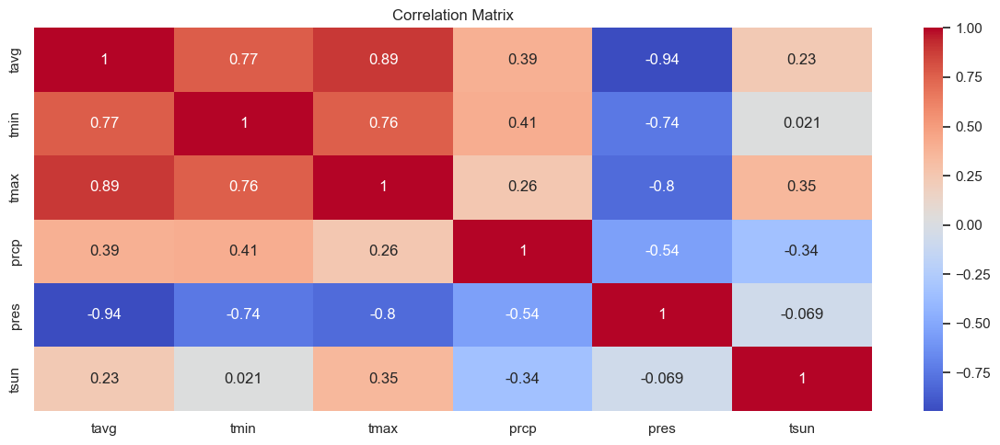

In [47]:
corr=df.corr(method='pearson')
plt.figure(figsize=(12,5))
sns.heatmap(corr,annot=True,cmap='coolwarm',fmt='.2g')
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

C:\Users\Neeharika\AppData\Local\Temp\ipykernel_16096\3358274741.py:14: UserWarning: Glyph 127777 (\N{THERMOMETER}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\Neeharika\AppData\Local\Temp\ipykernel_16096\3358274741.py:14: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\Neeharika\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 127777 (\N{THERMOMETER}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\Neeharika\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


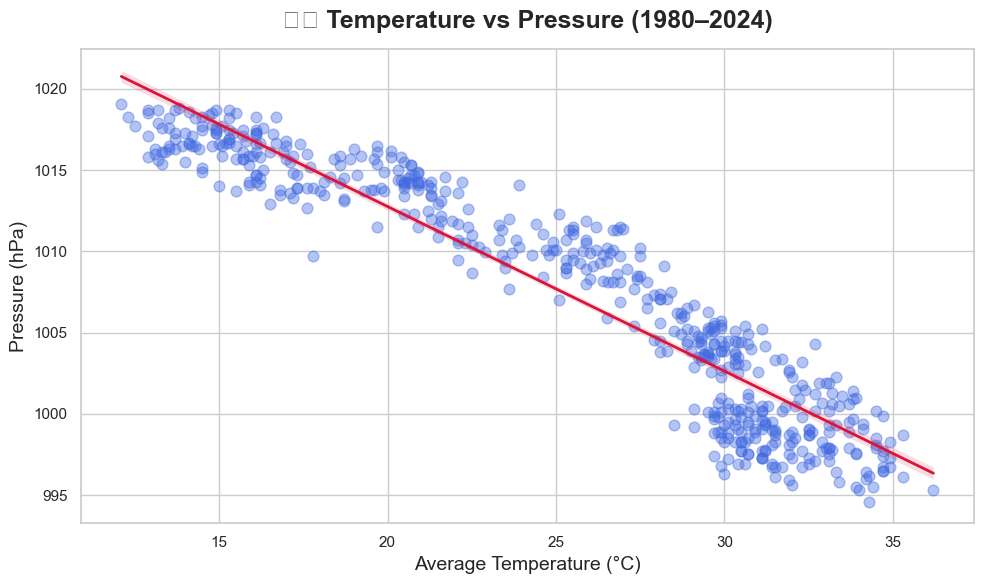

In [48]:
# plot temp and pres 
plt.figure(figsize=(10, 6))
sns.regplot(
    data=df,
    x='tavg',
    y='pres',
    scatter_kws={'alpha':0.4, 's':60, 'color':'royalblue'},
    line_kws={'color':'crimson', 'lw':2}
)

plt.title('🌡️ Temperature vs Pressure (1980–2024)', fontsize=18, weight='bold', pad=15)
plt.xlabel('Average Temperature (°C)', fontsize=14)
plt.ylabel('Pressure (hPa)', fontsize=14)
plt.tight_layout()
plt.show()

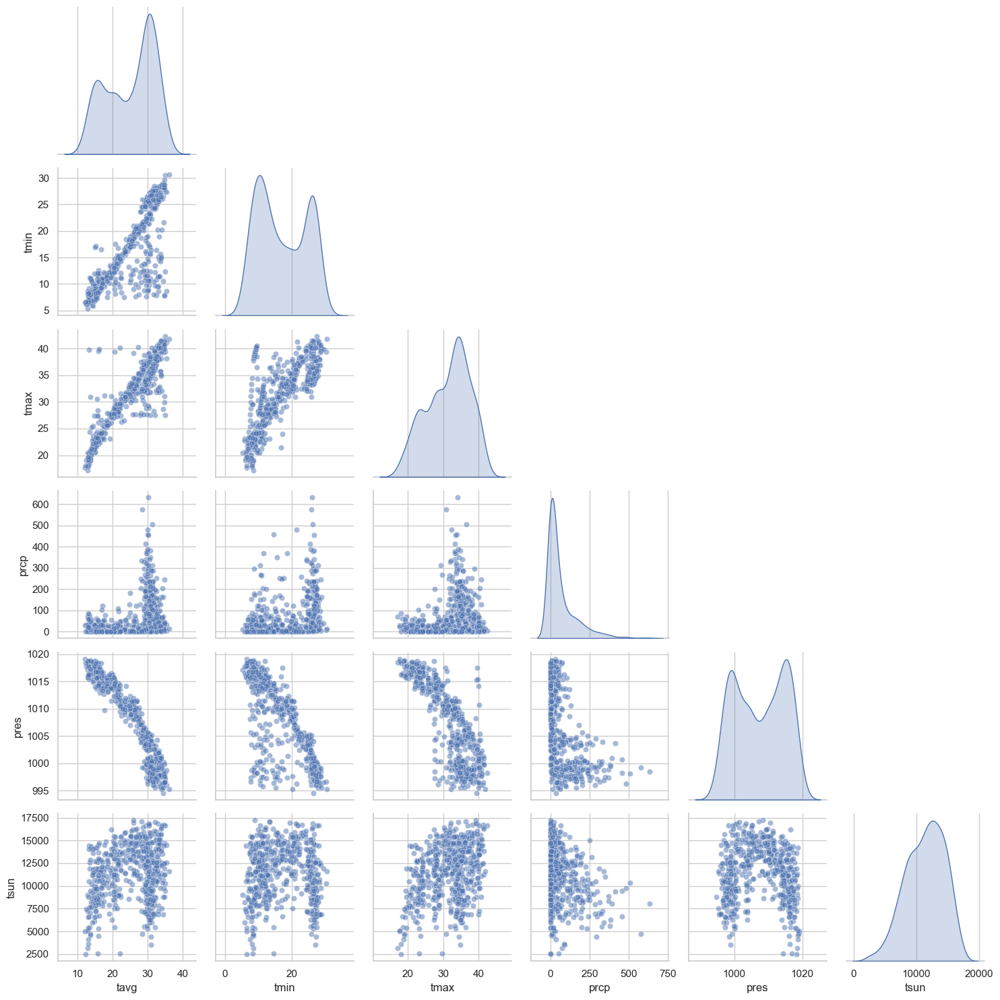

In [49]:
sns.pairplot(df, diag_kind="kde", corner=True, plot_kws={'alpha':0.5})
plt.tight_layout()
plt.show()

#### The pairplot seems cloudy and highly skewed.

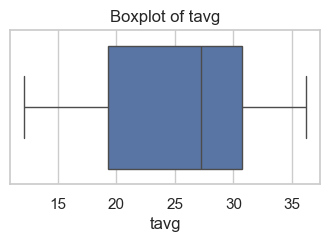

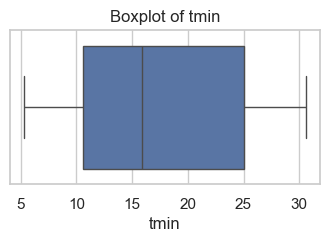

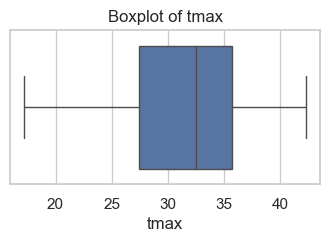

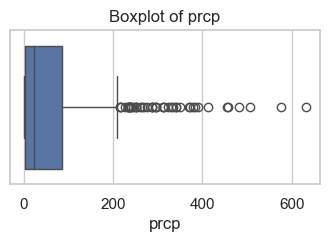

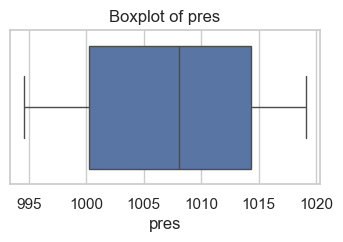

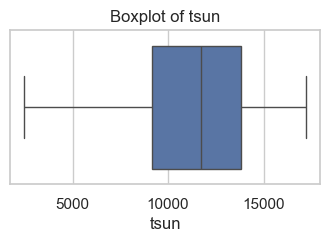

In [51]:
for col in df.columns:
    plt.figure(figsize=(4,2))
    sns.boxplot(x=df[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

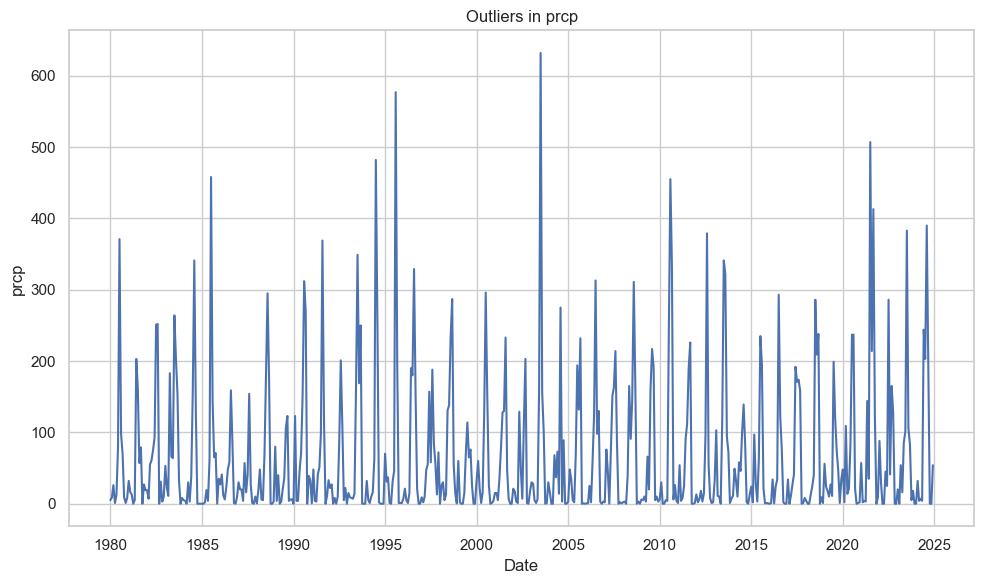

In [52]:
## checking outliers for prcp
plt.figure(figsize=(10,6))
sns.lineplot(data=df,x=df.index,y='prcp')
plt.title('Outliers in prcp')
plt.xlabel('Date')
plt.ylabel('prcp')
plt.tight_layout()
plt.show()

## Using prophet on tavg, pres, prcp and tsun

### Data prep

In [55]:
df=df.reset_index()

In [56]:
df.head()

,date,tavg,tmin,tmax,prcp,pres,tsun
0,1980-01-01,14.1,NaN,NaN,5.0,1016.6,14040.0
1,1980-02-01,18.1,11.000000,25.3,9.0,1013.5,14880.0
2,1980-03-01,21.6,16.848333,28.1,26.0,1011.9,12780.0
3,1980-04-01,30.3,23.100000,38.2,1.0,1005.1,16740.0
4,1980-05-01,34.5,21.670093,41.3,12.0,1000.2,16740.0


In [57]:
df_tavg = df[['date', 'tavg']].rename(columns={'date': 'ds', 'tavg': 'y'})

In [58]:
df_tavg.head()

,ds,y
0,1980-01-01,14.1
1,1980-02-01,18.1
2,1980-03-01,21.6
3,1980-04-01,30.3
4,1980-05-01,34.5


In [59]:
df_pres=df[['date','pres']].rename(columns={'date':'ds','pres':'y'})

In [60]:
df_prcp=df[['date','prcp']].rename(columns={'date':'ds','prcp':'y'})

In [61]:
df_tsun=df[['date','tsun']].rename(columns={'date':'ds','tsun':'y'})

In [62]:
df_tsun.head()

,ds,y
0,1980-01-01,14040.0
1,1980-02-01,14880.0
2,1980-03-01,12780.0
3,1980-04-01,16740.0
4,1980-05-01,16740.0


#### Prophet

In [64]:
model_tavg=Prophet()
model_tavg.fit(df_tavg)
forecast=model_tavg.make_future_dataframe(periods=365)
forecast_tavg=model_tavg.predict(forecast)

fig=plot_plotly(model_tavg,forecast_tavg)
fig.update_xaxes(range=['1980-01-01', '2025-12-01'])  # set min/max
fig.show()

21:44:54 - cmdstanpy - INFO - Chain [1] start processing
21:44:54 - cmdstanpy - INFO - Chain [1] done processing


In [65]:
model_pres=Prophet()
model_pres.fit(df_pres)
forecast=model_pres.make_future_dataframe(periods=365)
forecast_pres=model_pres.predict(forecast)

fig=plot_plotly(model_pres,forecast_pres)
fig.update_xaxes(range=['1980-01-01', '2025-12-01'])
fig.show()

21:44:56 - cmdstanpy - INFO - Chain [1] start processing
21:44:56 - cmdstanpy - INFO - Chain [1] done processing


In [66]:
model_prcp=Prophet()
model_prcp.fit(df_prcp)
forecast=model_prcp.make_future_dataframe(periods=365)
forecast_prcp=model_prcp.predict(forecast)

fig=plot_plotly(model_prcp,forecast_prcp)
fig.update_xaxes(range=['1980-01-01', '2025-12-01'])
fig.show()

21:44:56 - cmdstanpy - INFO - Chain [1] start processing
21:44:57 - cmdstanpy - INFO - Chain [1] done processing


In [67]:
model_tsun=Prophet()
model_tsun.fit(df_tsun)
forecast=model_tsun.make_future_dataframe(periods=365)
forecast_tsun=model_tsun.predict(forecast)

fig=plot_plotly(model_tsun,forecast_tsun)
fig.update_xaxes(range=['1980-01-01', '2025-12-01'])
fig.show()

21:44:57 - cmdstanpy - INFO - Chain [1] start processing
21:44:57 - cmdstanpy - INFO - Chain [1] done processing


In [68]:
y_true_tavg=df_tavg['y']
y_pred_tavg=forecast_tavg['yhat'][:len(df_tavg)]

print("MAE  (Mean Absolute Error): ", mean_absolute_error(y_true_tavg, y_pred_tavg))
print("MSE  (Mean Squared Error): ", mean_squared_error(y_true_tavg, y_pred_tavg))
print("RMSE (Root Mean Squared Error): ", np.sqrt(mean_squared_error(y_true_tavg, y_pred_tavg)))

MAE  (Mean Absolute Error):  0.8222362889640402
MSE  (Mean Squared Error):  1.1212837492505268
RMSE (Root Mean Squared Error):  1.0589068652391138


In [69]:
y_true_pres=df_pres['y']
y_pred_pres=forecast_pres['yhat'][:len(df_pres)]

print("MAE  (Mean Absolute Error): ", mean_absolute_error(y_true_pres, y_pred_pres))
print("MSE  (Mean Squared Error): ", mean_squared_error(y_true_pres, y_pred_pres))
print("RMSE (Root Mean Squared Error): ", np.sqrt(mean_squared_error(y_true_pres, y_pred_pres)))

MAE  (Mean Absolute Error):  0.830657393438132
MSE  (Mean Squared Error):  1.0990752342280037
RMSE (Root Mean Squared Error):  1.0483678906891434


In [70]:
y_true_prcp=df_prcp['y']
y_pred_prcp=forecast_prcp['yhat'][:len(df_prcp)]

print("MAE  (Mean Absolute Error): ", mean_absolute_error(y_true_prcp, y_pred_prcp))
print("MSE  (Mean Squared Error): ", mean_squared_error(y_true_prcp, y_pred_prcp))
print("RMSE (Root Mean Squared Error): ", np.sqrt(mean_squared_error(y_true_prcp, y_pred_prcp)))

MAE  (Mean Absolute Error):  38.09479159724515
MSE  (Mean Squared Error):  3974.0449510548124
RMSE (Root Mean Squared Error):  63.04002657879209


In [71]:
y_true_tsun=df_tsun['y']
y_pred_tsun=forecast_tsun['yhat'][:len(df_tsun)]

print("MAE  (Mean Absolute Error): ", mean_absolute_error(y_true_tsun, y_pred_tsun))
print("MSE  (Mean Squared Error): ", mean_squared_error(y_true_tsun, y_pred_tsun))
print("RMSE (Root Mean Squared Error): ", np.sqrt(mean_squared_error(y_true_tsun, y_pred_tsun)))

MAE  (Mean Absolute Error):  1577.4988053027382
MSE  (Mean Squared Error):  3946726.2230910915
RMSE (Root Mean Squared Error):  1986.6369127475436


## Second Approach - 
### Using VAR for predicting strongly correlated features and prophet for weakly correlated features

#### Assumptions - series is linear and stationany.
##### Check for stationary

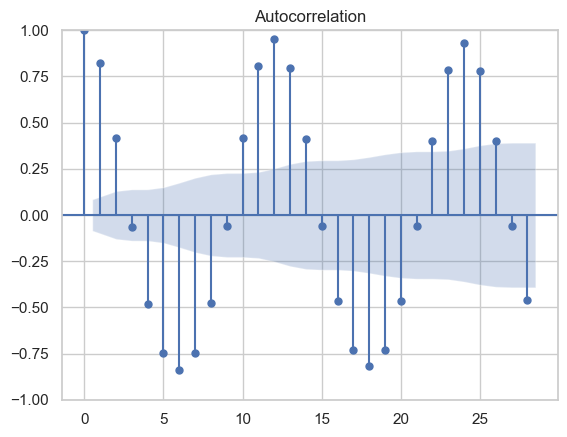

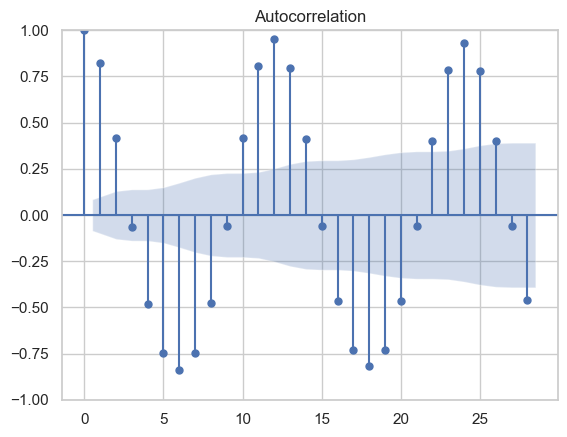

In [145]:
from statsmodels.graphics.tsaplots import plot_acf

plot_acf(df['tavg'])

In [167]:
df_var=df.dropna()  ######### VERY VERY IMPORTANT

In [183]:
from statsmodels.tsa.stattools import adfuller
features=['tavg','tmin','tmax','pres']

for i in features:
    result = adfuller(df_var[i])
    print(f"p-value for {i}: {result[1]}")

# result = adfuller(df['tmax'])
# print("ADF Statistic:", result[0])
# print("p-value:", result[1])


p-value for tavg: 0.0005067628852490242
p-value for tmin: 0.34277822951819836
p-value for tmax: 8.261142869879069e-10
p-value for pres: 2.6300006453418565e-07


In [185]:
from statsmodels.tsa.stattools import kpss

for i in features:
    result = kpss(df_var[i], regression='c')
    print(f"p-value for {i}: {result[1]}")
    
# result = kpss(df['pres'], regression='c')  # 'c' = level stationarity
# print("KPSS Statistic:", result[0])
# print("p-value:", result[1])


p-value for tavg: 0.1
p-value for tmin: 0.01
p-value for tmax: 0.1
p-value for pres: 0.1


C:\Users\Neeharika\AppData\Local\Temp\ipykernel_16096\3287721095.py:4: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.


C:\Users\Neeharika\AppData\Local\Temp\ipykernel_16096\3287721095.py:4: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.


C:\Users\Neeharika\AppData\Local\Temp\ipykernel_16096\3287721095.py:4: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.


C:\Users\Neeharika\AppData\Local\Temp\ipykernel_16096\3287721095.py:4: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




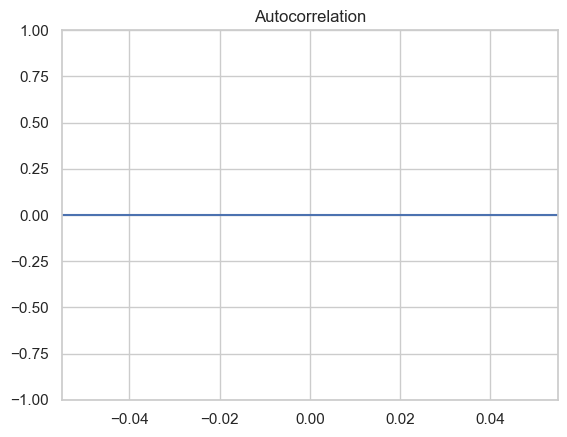

In [199]:

plot_acf(df['tmin'])
plt.show()

In [215]:
df.head()

,date,tavg,tmin,tmax,prcp,pres,tsun
0,1980-01-01,14.1,NaN,NaN,5.0,1016.6,14040.0
1,1980-02-01,18.1,11.000000,25.3,9.0,1013.5,14880.0
2,1980-03-01,21.6,16.848333,28.1,26.0,1011.9,12780.0
3,1980-04-01,30.3,23.100000,38.2,1.0,1005.1,16740.0
4,1980-05-01,34.5,21.670093,41.3,12.0,1000.2,16740.0


In [217]:
var_df=df[['tavg','pres']]
var_df=var_df.dropna()
var_df.index=pd.to_datetime(df['date'])
var_df.head()

,tavg,pres
date,,
1980-01-01,14.1,1016.6
1980-02-01,18.1,1013.5
1980-03-01,21.6,1011.9
1980-04-01,30.3,1005.1
1980-05-01,34.5,1000.2


In [221]:
var_df.tail()

,tavg,pres
date,,
2024-08-01,29.9,1001.0
2024-09-01,29.3,1003.3
2024-10-01,28.2,1009.1
2024-11-01,22.2,1014.3
2024-12-01,15.8,1016.8


In [223]:
from statsmodels.tsa.api import VAR
model=VAR(var_df)
results=model.fit(maxlags=12,ic='aic')
print("Chosen lag order:", results.k_ar)

Chosen lag order: 12


C:\Users\Neeharika\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



In [227]:
lag_order=results.k_ar
forecast=results.forecast(var_df.values[-lag_order:],steps=12)

future_index=pd.date_range(start='2025-01-01',periods=12,freq='MS')
forecast_df=pd.DataFrame(forecast,index=future_index,columns=var_df.columns)

print(forecast_df.head())

                 tavg         pres
2025-01-01  13.540646  1017.404966
2025-02-01  16.225273  1015.276170
2025-03-01  22.201504  1011.419764
2025-04-01  28.905574  1006.383887
2025-05-01  33.119190  1001.359877


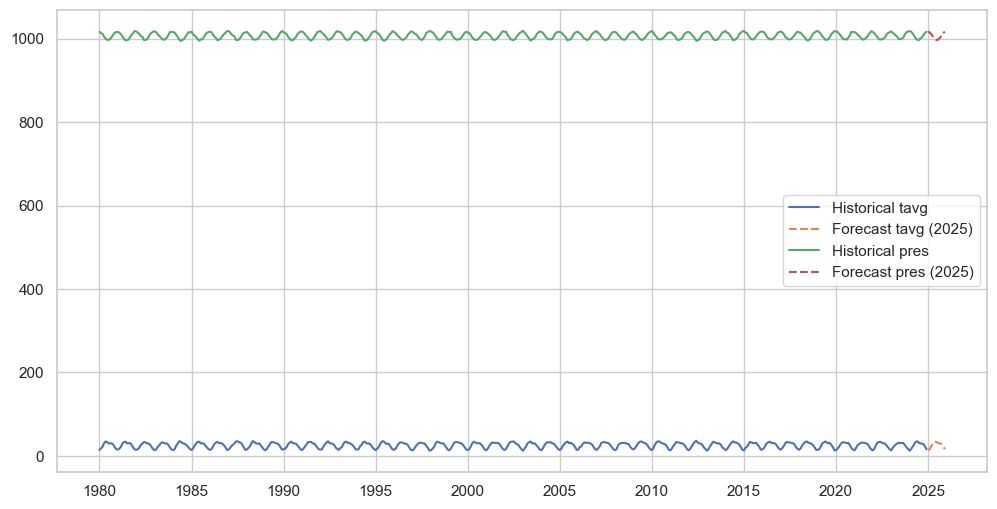

In [231]:
plt.figure(figsize=(12,6))
for col in var_df.columns:
    plt.plot(var_df[col], label=f"Historical {col}")
    plt.plot(forecast_df[col], label=f"Forecast {col} (2025)", linestyle='--')
plt.legend()
plt.show()


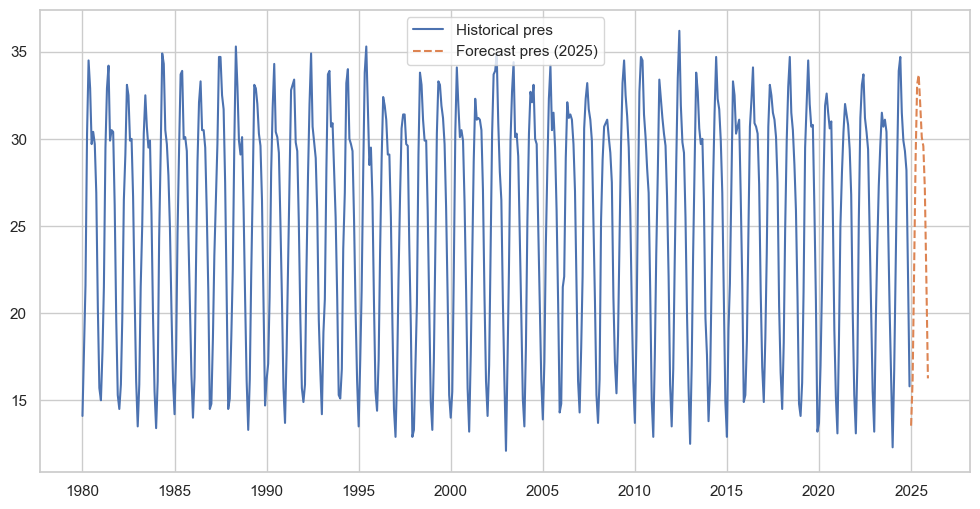

In [233]:
plt.figure(figsize=(12,6))
plt.plot(var_df['tavg'], label=f"Historical {col}")
plt.plot(forecast_df['tavg'], label=f"Forecast {col} (2025)", linestyle='--')
plt.legend()
plt.show()

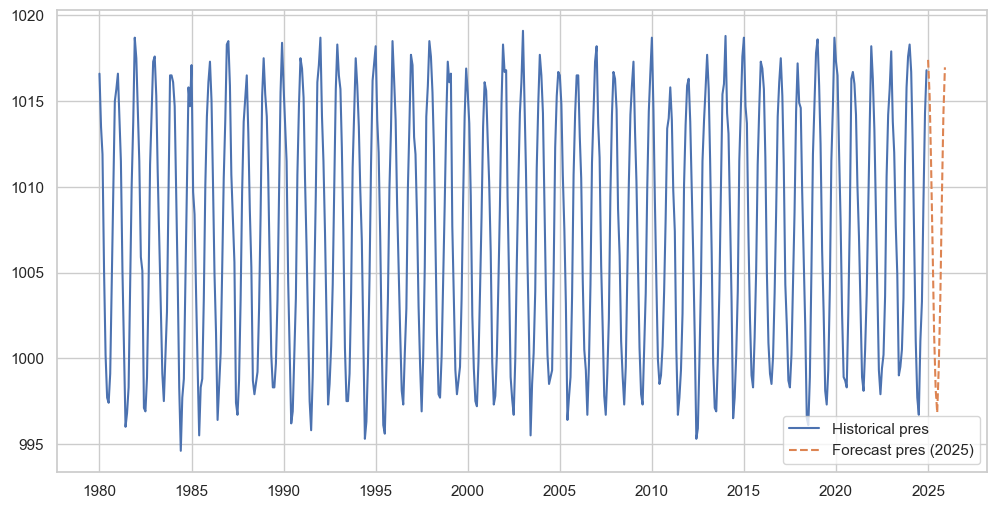

In [235]:
plt.figure(figsize=(12,6))
plt.plot(var_df['pres'], label=f"Historical {col}")
plt.plot(forecast_df['pres'], label=f"Forecast {col} (2025)", linestyle='--')
plt.legend()
plt.show()